## Captura y etiquetado de las imágenes


In [1]:
import numpy as np
import pandas as pd
import cv2 as cv

from matplotlib.image import imread
import matplotlib.pyplot as plt

import os
from os import listdir
from os.path import isfile, join

import PIL
import PIL.Image
import tensorflow as tf

# Creación de conjuntos y subconjuntos de entrenamiento.

In [15]:
# Datos comunes a todos los conjuntos
batch_size = 32   # tamaño de los conjuntos de entrenamiento que se le pasan al modelo para que no aprenda todo de golpe y no se bloquee.
img_height = 144
img_width = 144
val_sp = 0.2
seed_ = 123

signs_tags = ['Speed20','Speed30','Speed50','Speed60','Speed70','Speed80','Speed100','NoSpeed80','Speed120','NoOvertake','NoOvertakeTruck','WarnCross','PriorRoad','GiveWay','Stop','Forbid','ForbidTruck','NoWay','Warning','WarnLeft','WarnRight','WarnZigZag','WarnBumps','WarnSlide','WarnNarrow','WarnWork','WarnTrafficLight','WarnPedes','WarnSchool','WarnBikes','WarnSnow','WarnWild','StopProhib','MandRight','MandLeft','MandStraight','MandStrRig','MandSTrLef','MandRight2','MandLeft2','MandRound','StopProhibOvertake','StopProhibOvertakeTruck']

In [3]:
# Generación del conjunto de X_test
df_dict = []
data_path = os.getcwd() + os.sep + 'documentation' + os.sep + 'Alemania' + os.sep + 'Test'
only_image_names = [f for f in listdir(data_path) if isfile(join(data_path, f))]
for image_name in only_image_names:
    if ".png" in image_name:      
        image_fullpath = data_path + os.sep + image_name
        image_cv = cv.imread(image_fullpath)     # con el 0 se lee en blanco y negro, sin nada, se lee en color

        # las imagenes originales tienen tamañanos distintos  -> con esta función se ponen en el tamaño común para todas (y será el tamaño de entrada al modelo)
        image_cv = cv.resize(image_cv, (img_height, img_width)) 
        df_dict.append({'image':image_cv})

df = pd.DataFrame(df_dict)
X_test = np.stack(np.array(df["image"]))

In [38]:
## CONJUNTOS DE ENTRENAMIENTO Y VALIDACIÓN ESPECÍFICOS PARA EL MODELO OPCIÓN 1 ##
# 1 submodelos: submodelo de reconocimiento de clase de señal ('speed','no_speed','others') y submodelo de reconocimiento de señal ('speedXX')

# Conjunto de entrenamiento/validación para el submodelo de reconocimiento de clases de la opción 1 ('speed','no_speed','others')
data_dir_opt1_class = os.getcwd() + os.sep + 'documentation' + os.sep + 'Alemania' + os.sep + 'Train_1'
train_ds_opt1_class = tf.keras.preprocessing.image_dataset_from_directory(data_dir_opt1_class, validation_split=val_sp, subset="training", seed=seed_, 
  image_size=(img_height, img_width), batch_size=batch_size)
val_ds_opt1_class = tf.keras.preprocessing.image_dataset_from_directory(data_dir_opt1_class, validation_split=val_sp, subset="validation", seed=seed_,
  image_size=(img_height, img_width), batch_size=batch_size)
print(train_ds_opt1_class.class_names)

# Conjunto de entrenamiento/validación para el submodelo de reconocimiento de señales de la opción 2 ('speedXX','forbid')
data_dir_opt1_signs = os.getcwd() + os.sep + 'documentation' + os.sep + 'Alemania' + os.sep + 'Train_1' + os.sep + 'speed'
train_ds_opt1_signs = tf.keras.preprocessing.image_dataset_from_directory(data_dir_opt1_signs, validation_split=val_sp, subset="training", seed=seed_, 
  image_size=(img_height, img_width), batch_size=batch_size)
val_ds_opt1_signs = tf.keras.preprocessing.image_dataset_from_directory(data_dir_opt1_signs, validation_split=val_sp, subset="validation", seed=seed_,
  image_size=(img_height, img_width), batch_size=batch_size)

print(train_ds_opt1_signs.class_names)

Found 39209 files belonging to 3 classes.
Using 31368 files for training.
Found 39209 files belonging to 3 classes.
Using 7841 files for validation.
['no_speed', 'others', 'speed']
Found 12780 files belonging to 8 classes.
Using 10224 files for training.
Found 12780 files belonging to 8 classes.
Using 2556 files for validation.
['speed100', 'speed120', 'speed20', 'speed30', 'speed50', 'speed60', 'speed70', 'speed80']


In [13]:
## CONJUNTOS DE ENTRENAMIENTO Y VALIDACIÓN ESPECÍFICOS PARA EL MODELO OPCIÓN 2 ##
# 2 submodelos: submodelo de reconocimiento de clase de señal ('target','no_target','others') y submodelo de reconocimiento de señal ('speedXX','forbid')

# Conjunto de entrenamiento/validación para el submodelo de reconocimiento de clases de la opción 2 ('target','no_target','others')
data_dir_opt2_class = os.getcwd() + os.sep + 'documentation' + os.sep + 'Alemania' + os.sep + 'Train_2'
train_ds_opt2_class = tf.keras.preprocessing.image_dataset_from_directory(data_dir_opt2_class, validation_split=val_sp, subset="training", seed=seed_, 
  image_size=(img_height, img_width), batch_size=batch_size)
val_ds_opt2_class = tf.keras.preprocessing.image_dataset_from_directory(data_dir_opt2_class, validation_split=val_sp, subset="validation", seed=seed_,
  image_size=(img_height, img_width), batch_size=batch_size)
print(train_ds_opt2_class.class_names)

# Conjunto de entrenamiento/validación para el submodelo de reconocimiento de señales de la opción 2 ('speedXX','forbid')
data_dir_opt2_signs = os.getcwd() + os.sep + 'documentation' + os.sep + 'Alemania' + os.sep + 'Train_2' + os.sep + 'target'
train_ds_opt2_signs = tf.keras.preprocessing.image_dataset_from_directory(data_dir_opt2_signs, validation_split=val_sp, subset="training", seed=seed_, 
  image_size=(img_height, img_width), batch_size=batch_size)
val_ds_opt2_signs = tf.keras.preprocessing.image_dataset_from_directory(data_dir_opt2_signs, validation_split=val_sp, subset="validation", seed=seed_,
  image_size=(img_height, img_width), batch_size=batch_size)

print(train_ds_opt2_signs.class_names)

Found 39209 files belonging to 3 classes.
Using 31368 files for training.
Found 39209 files belonging to 3 classes.
Using 7841 files for validation.
['no_target', 'others', 'target']
Found 17310 files belonging to 9 classes.
Using 13848 files for training.
Found 17310 files belonging to 9 classes.
Using 3462 files for validation.
['forbid', 'speed100', 'speed120', 'speed20', 'speed30', 'speed50', 'speed60', 'speed70', 'speed80']


In [43]:
# Conjunto de entrenamiento/validación para el submodelo de reconocimiento de señales de la opción 0 (directamente discernir entre 'speedXX' y 'noSpeed')
data_dir_opt0_signs = os.getcwd() + os.sep + 'documentation' + os.sep + 'Alemania' + os.sep + 'Train'
train_ds_opt0_signs = tf.keras.preprocessing.image_dataset_from_directory(data_dir_opt0_signs, validation_split=val_sp, subset="training", seed=seed_, 
  image_size=(img_height, img_width), batch_size=batch_size)
val_ds_opt0_signs = tf.keras.preprocessing.image_dataset_from_directory(data_dir_opt0_signs, validation_split=val_sp, subset="validation", seed=seed_,
  image_size=(img_height, img_width), batch_size=batch_size)

print(train_ds_opt0_signs.class_names)

Found 39209 files belonging to 9 classes.
Using 31368 files for training.
Found 39209 files belonging to 9 classes.
Using 7841 files for validation.
['noSpeed', 'speed100', 'speed120', 'speed20', 'speed30', 'speed50', 'speed60', 'speed70', 'speed80']


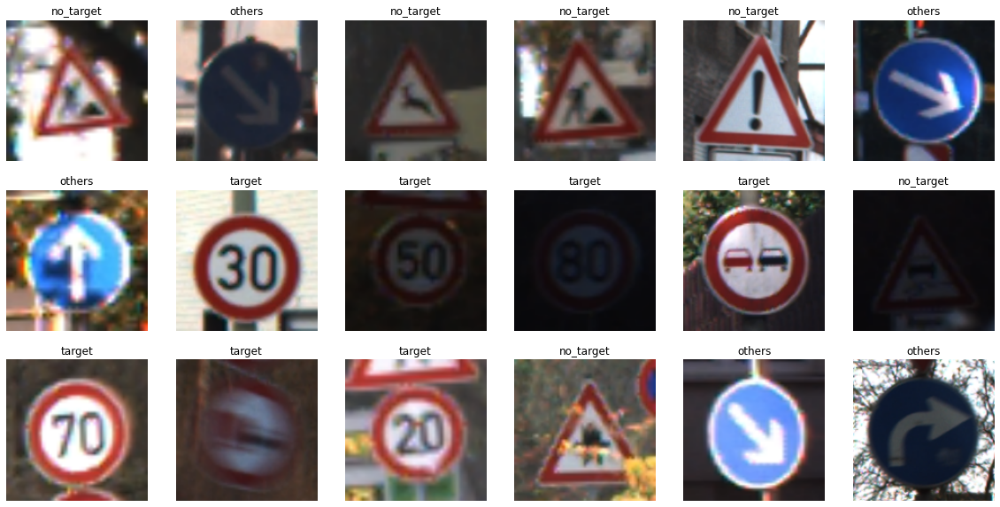

In [4]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))
for images, labels in train_ds.take(1):
  for i in range(18):
    ax = plt.subplot(3, 6, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(val_ds_opt2_class.class_names[labels[i]])
    plt.axis("off")

# Entrenamiento de modelos y submodelos

### Carga de la plantilla vgg16 desentrenada

In [48]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras import datasets, layers, models

bm_vgg16 = VGG16(input_shape = (img_height, img_width, 3),
                  include_top=False,        # permite entrenar el modelo con una resolución distinta a la original (en este caso 48x48)
                  weights = 'imagenet')

# no se entrenan las capas previamente entrenadas
for layer in bm_vgg16.layers:
    layer.trainable = False

## Entrenamiento del modelo vgg16 para la opción 0 

### Entrenamiento del modelo model_vgg16_signs0 (identificación directa de las señales de velocidad)

### Datos relevantes:
model_vgg16_signs0
* Entrenamiento del modelo con 3 épocas: 1739s + 1767s + 1872s = 89min 38sec
* Accuracy del set de validación: 0.9274 + 0.9483 + 0.9531 = 0.9429  --> el problema con esta accuracy tan alta es que incluye señales que no son de velocidad, que son el objetivo final de este modelo de reconocimiento
* Tiempo de predicción (12000+ imágenes del conjunto X_test): 9min21sec

In [47]:
##### CAPAS AÑADIDAS PARA EL MODELO DE LA OPCIÓN 0  #####
x0 = layers.Flatten()(bm_vgg16_class2.output)   # se aplana el output a una sola dimensión para hacerlo manipulable
x1 = layers.Dense(512, activation='relu')(x0)   
x2 = layers.Dropout(0.5)(x1)                    
x3 = layers.Dense(9 , activation='softmax')(x2) # se añade una última capa con 9 neuronas porque hay 9 clases ('no_speed', 'others', 'speed')

# se concatena la primera capa (bm_vgg16.input) con la última capa (x3)
model_vgg16_signs0 = tf.keras.models.Model(bm_vgg16_class2.input, x3)

model_vgg16_signs0.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy',metrics = ['acc'])
vgg16_signs0_hist = model_vgg16_signs0.fit(train_ds_opt0_signs, validation_data = val_ds_opt0_signs, epochs = 3, verbose=1)

Epoch 1/3
981/981 [==============================] - 1739s 2s/step - loss: 0.9333 - acc: 0.8268 - val_loss: 0.2220 - val_acc: 0.9274
Epoch 2/3
981/981 [==============================] - 1767s 2s/step - loss: 0.3609 - acc: 0.8898 - val_loss: 0.1613 - val_acc: 0.9483
Epoch 3/3
981/981 [==============================] - 1872s 2s/step - loss: 0.2986 - acc: 0.9080 - val_loss: 0.1436 - val_acc: 0.9531


In [57]:
%%time
predictions_vgg16_signs0 = model_vgg16_signs0.predict(X_test)

Wall time: 9min 46s


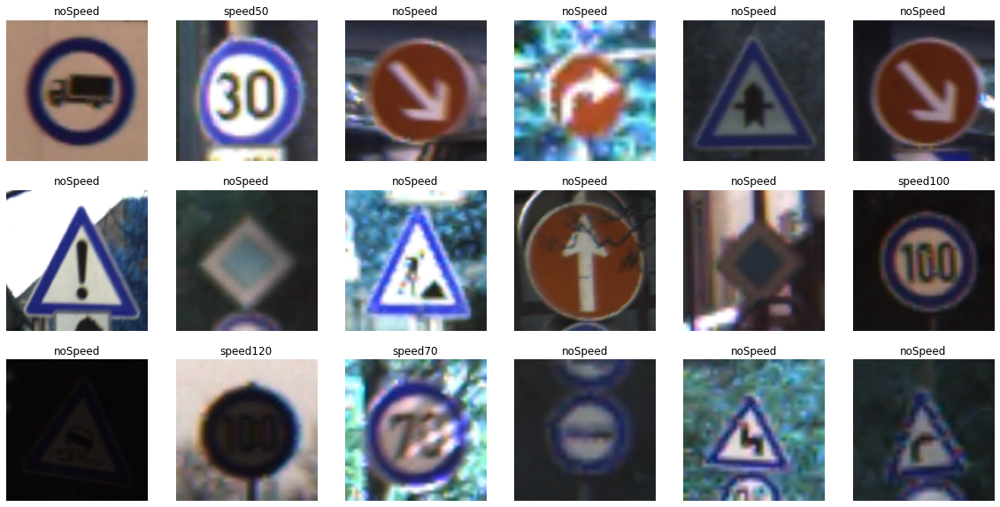

In [52]:
plt.figure(figsize=(20, 10))
for i in range(18):
    ax = plt.subplot(3, 6, i + 1)
    plt.imshow(X_test[i])
    plt.title(train_ds_opt0_signs.class_names[np.argmax(predictions_vgg16_signs0[i])])
    plt.axis("off")

In [53]:
# se guarda el modelo en la carpeta correspondiente
model_vgg16_signs0.save('./models/model_vgg16_signs0.h5')
model_vgg16_signs0.save_weights('./models/model_vgg16_signs0_wg.h5')

In [54]:
# Generación del conjunto de X_test_70 específico para comprobar el modelo opción 0
df_dict_70 = []
data_path_70 = os.getcwd() + os.sep + 'documentation' + os.sep + 'Alemania' + os.sep + 'Train' + os.sep + 'speed70'
only_image_names_70 = [f for f in listdir(data_path_70) if isfile(join(data_path_70, f))]
for image_name in only_image_names_70:
    if ".png" in image_name:      
        image_fullpath = data_path_70 + os.sep + image_name
        image_cv = cv.imread(image_fullpath)     # con el 0 se lee en blanco y negro, sin nada, se lee en color

        # las imagenes originales tienen tamañanos distintos  -> con esta función se ponen en el tamaño común para todas (y será el tamaño de entrada al modelo)
        image_cv = cv.resize(image_cv, (img_height, img_width)) 
        df_dict_70.append({'image':image_cv})

df_70 = pd.DataFrame(df_dict_70)
X_test_70 = np.stack(np.array(df_70["image"]))

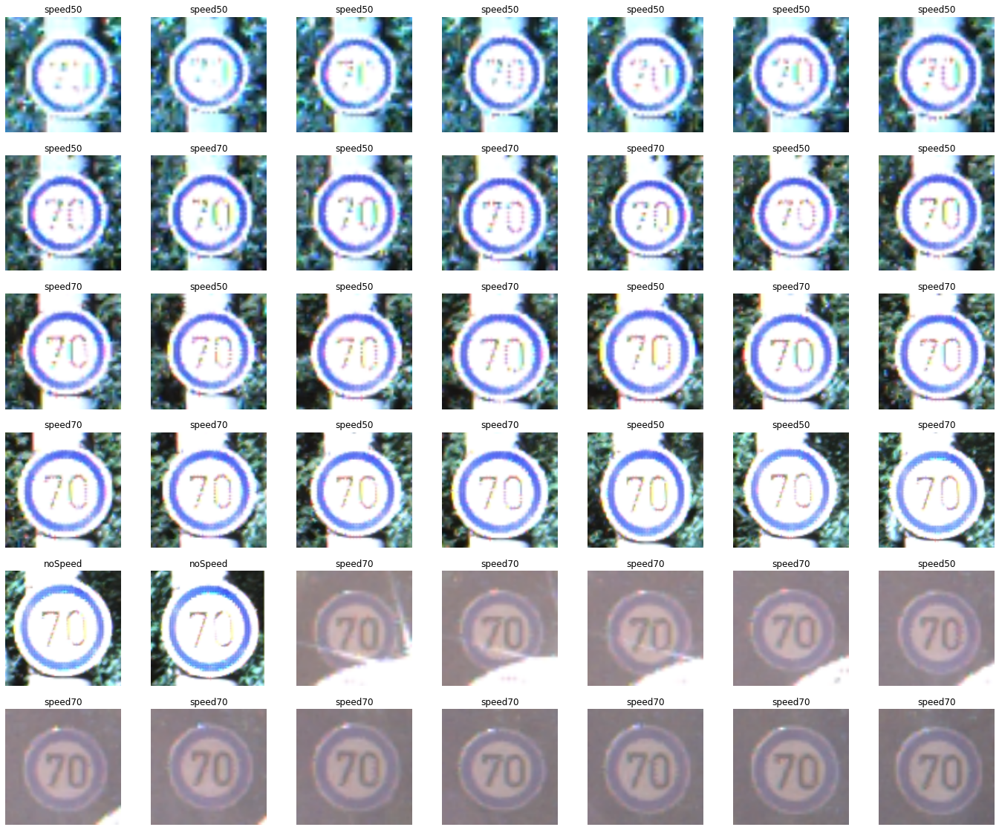

In [56]:
predictions_vgg16_signs0_70 = model_vgg16_signs0.predict(X_test_70)
plt.figure(figsize=(24, 20))
for i in range(42):
    ax = plt.subplot(6, 7, i + 1)
    plt.imshow(X_test_70[i])
    plt.title(train_ds_opt0_signs.class_names[np.argmax(predictions_vgg16_signs0_70[i])])
    plt.axis("off")

## Entrenamiento del modelo vgg16 para la opción 1 

### Entrenamiento de los submodelos `model_vgg16_class1` (submodelo de clasificación) y `model_vgg16_signs1` (submodelo de identificación)
* model_vgg16_class1 = clasifica las señales entre speed - no_speed - others
* model_vgg16_signs1 = si la señal es de tipo 'speed' (que incluye las de velocidad), devuelve la señal exacta que es.

### Datos relevantes:
model_vgg16_class1
* Entrenamiento del modelo con 3 épocas: 678s + 677s + 726s = 34min41sec
* Accuracy del set de validación: 0.989 + 0.9966 + 0.9926 = 0.9927
* Tiempo de predicción (12000+ imágenes del conjunto X_test): 9min21sec

model_vgg16_signs1
* Entrenamiento del modelo con 3 épocas: 570 + 558 + 571 =  28min 19sec
* Accuracy del set de validación: 0.8505 + 0.9014 + 0.9073 = 0.8864 accuracy
* Tiempo de predicción (imágenes del conjunto X_test clasificadas como 'speed'): 3min 24s

In [32]:
##### CAPAS ADICIONALES PARA EL SUBMODELO DE CLASIFICACIÓN DE LA OPCIÓN 1 #####
x0 = layers.Flatten()(bm_vgg16.output)   # se aplana el output a una sola dimensión para hacerlo manipulable
x1 = layers.Dense(512, activation='relu')(x0)   
x2 = layers.Dropout(0.5)(x1)                    
x3 = layers.Dense(3 , activation='softmax')(x2) # se añade una última capa con 3 neuronas porque hay 3 clases ('no_speed', 'others', 'speed')

# se concatena la primera capa (bm_vgg16.input) con la última capa (x3)
model_vgg16_class1 = tf.keras.models.Model(bm_vgg16.input, x3)

model_vgg16_class1.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy',metrics = ['acc'])
vgg16_class1_hist = model_vgg16_class1.fit(train_ds_opt1_class, validation_data = val_ds_opt1_class, epochs = 3, verbose=1)

Epoch 1/3
246/246 [==============================] - 678s 3s/step - loss: 1.3366 - acc: 0.9501 - val_loss: 0.1258 - val_acc: 0.9890
Epoch 2/3
246/246 [==============================] - 677s 3s/step - loss: 0.4203 - acc: 0.9791 - val_loss: 0.0261 - val_acc: 0.9966
Epoch 3/3
246/246 [==============================] - 726s 3s/step - loss: 0.1981 - acc: 0.9893 - val_loss: 0.0866 - val_acc: 0.9926


In [33]:
%%time
predictions_vgg16_class1 = model_vgg16_class1.predict(X_test)

Wall time: 9min 21s


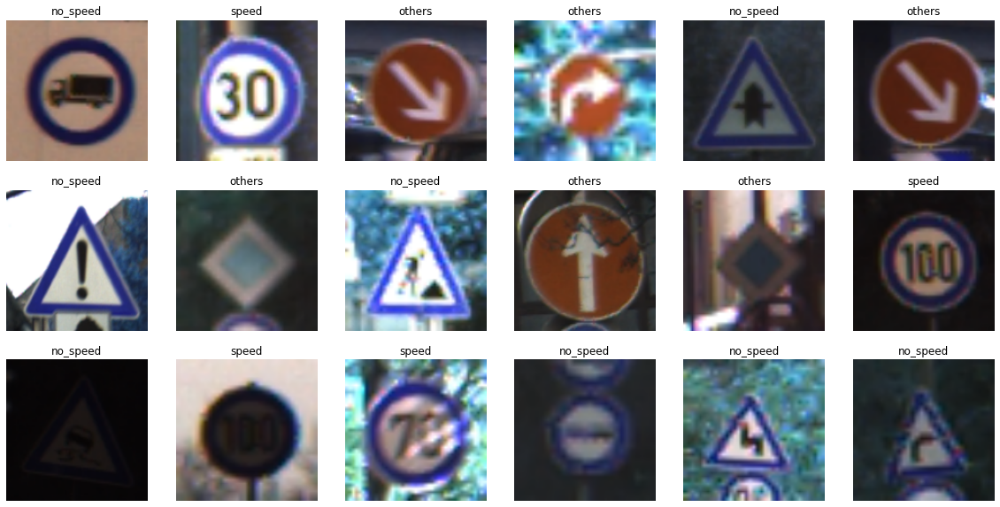

In [35]:
plt.figure(figsize=(20, 10))
for i in range(18):
    ax = plt.subplot(3, 6, i + 1)
    plt.imshow(X_test[i])
    plt.title(train_ds_opt1_class.class_names[np.argmax(predictions_vgg16_class1[i])])
    plt.axis("off")

In [36]:
# se guarda el modelo en la carpeta correspondiente
model_vgg16_class1.save('./models/model_vgg16_class1.h5')
model_vgg16_class1.save_weights('./models/model_vgg16_class1_wg.h5')

In [39]:
#####   CAPAS ADICIONALES PARA EL SUBMODELO DE IDENTIFICACIÓN DE LA OPCIÓN 1  #####
x0 = layers.Flatten()(bm_vgg16.output)   # se aplana el outùt a una sola dimensión para hacerlo manipulable
x1 = layers.Dense(512, activation='relu')(x0)   
x2 = layers.Dropout(0.5)(x1)                    
x3 = layers.Dense(9 , activation='softmax')(x2) # se añade una última capa con 9 neuronas porque hay 9 clases

# se concatena la primera capa (bm_vgg16_class2.input) con la última capa (x3)
model_vgg16_signs1 = tf.keras.models.Model(bm_vgg16.input, x3)

model_vgg16_signs1.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy',metrics = ['acc'])
vgg16_signs1_hist = model_vgg16_signs1.fit(train_ds_opt1_signs, validation_data = val_ds_opt1_signs, epochs = 3, verbose=1)

Epoch 1/3
320/320 [==============================] - 570s 2s/step - loss: 2.6940 - acc: 0.5984 - val_loss: 0.4821 - val_acc: 0.8505
Epoch 2/3
320/320 [==============================] - 558s 2s/step - loss: 0.6898 - acc: 0.7833 - val_loss: 0.3127 - val_acc: 0.9014
Epoch 3/3
320/320 [==============================] - 571s 2s/step - loss: 0.5276 - acc: 0.8344 - val_loss: 0.2904 - val_acc: 0.9073


In [41]:
%%time
# hay que crear un conjunto de test acorde con los resultados de submodelo de clasificación
df_test_signs1 = []
for i in range(len(X_test)):
    if np.argmax(predictions_vgg16_class1[i]) == 2:
        #df_test_signs2.append(X_test[i])
        df_test_signs1.append({'image':X_test[i]})

df = pd.DataFrame(df_test_signs1)
X_test_signs1 = np.stack(np.array(df["image"]))
predictions_vgg16_signs1 = model_vgg16_signs1.predict(X_test_signs1)

Wall time: 3min 24s


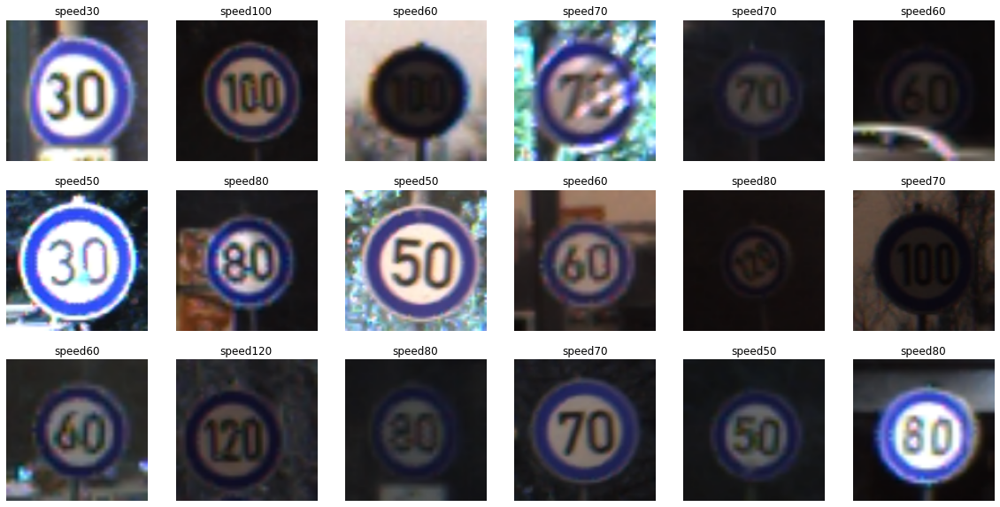

In [42]:
plt.figure(figsize=(20, 10))
for i in range(18):
    ax = plt.subplot(3, 6, i + 1)
    plt.imshow(X_test_signs1[i])
    plt.title(train_ds_opt1_signs.class_names[np.argmax(predictions_vgg16_signs1[i])])
    plt.axis("off")

In [40]:
# se guarda el modelo en la carpeta correspondiente
model_vgg16_signs1.save('./models/model_vgg16_signs1.h5')
model_vgg16_signs1.save_weights('./models/model_vgg16_signs1_wg.h5')

## Entrenamiento del modelo vgg16 para la opción 2 

### Entrenamiento de los submodelos model_vgg16_class2 (submodelo de clasificación) y model_vgg16_signs2 (submodelo de identificación)
* model_vgg16_class2 = clasifica las señales entre target - no_target - others
* model_vgg16_signs2 = si la señal es de tipo 'target' (que incluye las de velocidad), devuelve la señal exacta que es.

### Datos relevantes:
model_vgg16_class2
* Entrenamiento del modelo con 3 épocas: 1988s + 1980s + 1977s = 99min
* Accuracy del set de validación: 0.9966 + 0.9959 + 0.9977 = 0.9967
* Tiempo de predicción (12000+ imágenes del conjunto X_test): 10min19sec

model_vgg16_signs2
* Entrenamiento del modelo con 3 épocas: 798 + 862 + 836 =  41 min
* Accuracy del set de validación: 0.9966 + 0.9959 + 0.9977 = 0.9967 accuracy
* Tiempo de predicción (imágenes del conjunto X_test clasificadas como 'target'): 4min28sec


In [5]:
#####  CAPAS ADICIONALES PARA EL SUBMODELO DE CLASIFICACIÓN DE LA OPCIÓN 2  #####
x0 = layers.Flatten()(bm_vgg16.output)   # se aplana el output a una sola dimensión para hacerlo manipulable
x1 = layers.Dense(512, activation='relu')(x0)   
x2 = layers.Dropout(0.5)(x1)                    
x3 = layers.Dense(3 , activation='softmax')(x2) # se añade una última capa con 3 neuronas porque hay 3 clases (target - no_target - others)

# se concatena la primera capa (bm_vgg16.input) con la última capa (x3)
model_vgg16_class2 = tf.keras.models.Model(bm_vgg16.input, x3)

model_vgg16_class2.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy',metrics = ['acc'])
vgg16_class2_hist = model_vgg16_class2.fit(train_ds_opt2_class, validation_data = val_ds_opt2_class, epochs = 3, verbose=1)

Epoch 1/3
981/981 [==============================] - 1988s 2s/step - loss: 0.5777 - acc: 0.9859 - val_loss: 0.1127 - val_acc: 0.9966
Epoch 2/3
981/981 [==============================] - 1980s 2s/step - loss: 0.2126 - acc: 0.9961 - val_loss: 0.3189 - val_acc: 0.9959
Epoch 3/3
981/981 [==============================] - 1973s 2s/step - loss: 0.2033 - acc: 0.9965 - val_loss: 0.1852 - val_acc: 0.9977


In [6]:
%%time
predictions_vgg16_class2 = model_vgg16_class2.predict(X_test)

Wall time: 10min 19s


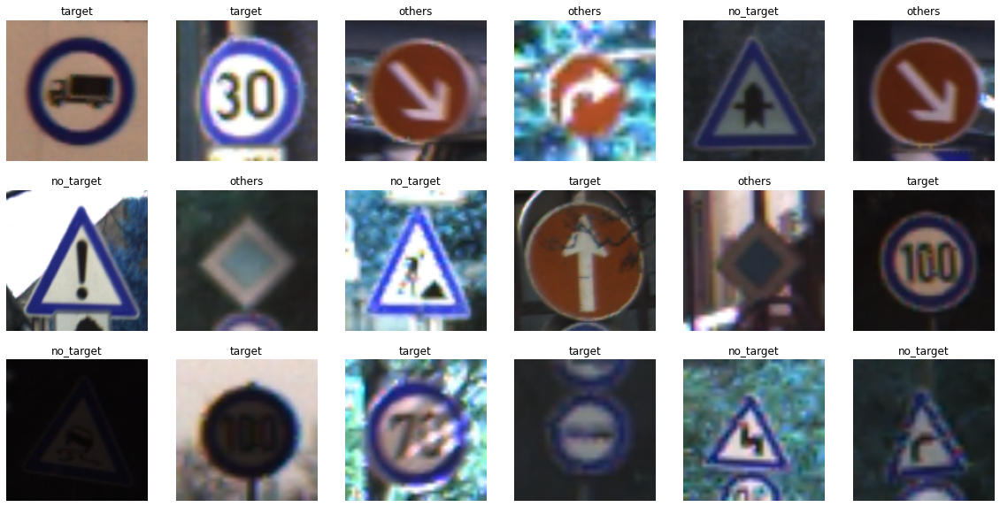

In [24]:
### DASHBOARD PARA HACER SEGUIMIENTO DE LOS RESULTADOS ###
plt.figure(figsize=(20, 10))
for i in range(18):
    ax = plt.subplot(3, 6, i + 1)
    plt.imshow(X_test[i])
    plt.title(train_ds_opt2_class.class_names[np.argmax(predictions_vgg16_class2[i])])
    plt.axis("off")

In [11]:
# se guarda el modelo en la carpeta correspondiente
model_vgg16_class2.save('./models/model_vgg16_class2.h5')
model_vgg16_class2.save_weights('./models/model_vgg16_class2_wg.h5')

In [19]:

#####  CAPAS ADICIONALES PARA EL SUBMODELO DE IDENTIFICACIÓN DE LA OPCIÓN 2  #####
# se crea un segundo submodelo que reconozca las señales de velocidad
x0 = layers.Flatten()(bm_vgg16.output)   # se aplana el outùt a una sola dimensión para hacerlo manipulable
x1 = layers.Dense(512, activation='relu')(x0)   
x2 = layers.Dropout(0.5)(x1)                    
x3 = layers.Dense(9 , activation='softmax')(x2) # se añade una última capa con 9 neuronas porque hay 9 clases

# se concatena la primera capa (bm_vgg16_class2.input) con la última capa (x3)
model_vgg16_signs2 = tf.keras.models.Model(bm_vgg16.input, x3)

model_vgg16_signs2.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy',metrics = ['acc'])
vgg16_signs2_hist = model_vgg16_signs2.fit(train_ds_opt2_signs, validation_data = val_ds_opt2_signs, epochs = 3, verbose=1)

Epoch 1/3
433/433 [==============================] - 798s 2s/step - loss: 2.0989 - acc: 0.6776 - val_loss: 0.3669 - val_acc: 0.8810
Epoch 2/3
433/433 [==============================] - 862s 2s/step - loss: 0.6205 - acc: 0.8086 - val_loss: 0.2991 - val_acc: 0.9055
Epoch 3/3
433/433 [==============================] - 836s 2s/step - loss: 0.5259 - acc: 0.8408 - val_loss: 0.2317 - val_acc: 0.9292


In [28]:
%%time
# hay que crear un conjunto de test acorde con los resultados de submodelo de clasificación
df_test_signs2 = []
for i in range(len(X_test)):
    if np.argmax(predictions_vgg16_class2[i]) == 2:
        #df_test_signs2.append(X_test[i])
        df_test_signs2.append({'image':X_test[i]})

df = pd.DataFrame(df_test_signs2)
X_test_signs2 = np.stack(np.array(df["image"]))
predictions_vgg16_signs2 = model_vgg16_signs2.predict(X_test_signs2)

Wall time: 4min 28s


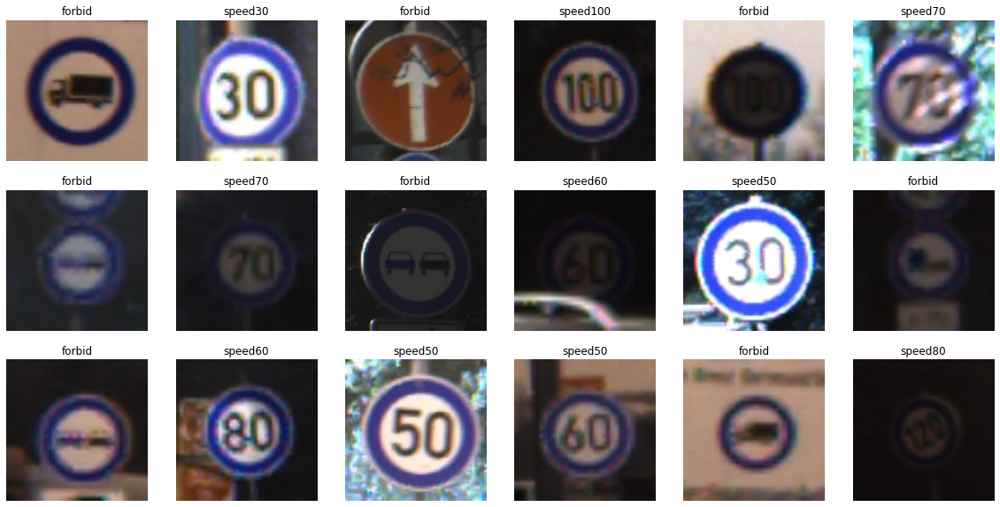

In [29]:
plt.figure(figsize=(20, 10))
for i in range(18):
    ax = plt.subplot(3, 6, i + 1)
    plt.imshow(X_test_signs2[i])
    plt.title(train_ds_opt2_signs.class_names[np.argmax(predictions_vgg16_signs2[i])])
    plt.axis("off")

In [30]:
# se guarda el modelo en la carpeta correspondiente
model_vgg16_signs2.save('./models/model_vgg16_signs2.h5')
model_vgg16_signs2.save_weights('./models/model_vgg16_signs2_wg.h5')

# otros modelos a entrenar (opcional)

In [17]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
import numpy as np
from skimage.io import imread
import cv2

# librería de apoyo para utilizar redes preentrenadas
from tensorflow.keras.applications.resnet_v2 import ResNet50V2, decode_predictions, preprocess_input
from tensorflow.keras.applications.vgg19 import VGG19



In [18]:
%%time
# con esta instrucción se está descargando el modelo completo original

base_model_RN50v2 = ResNet50V2(input_shape=(img_width, img_height, 3), include_top=False, weights = "imagenet", classifier_activation='softmax')
base_model_vgg19 = VGG19(input_shape=(img_width, img_height, 3), include_top=False, weights = "imagenet", classifier_activation='softmax')

# se entrenan las capas previamente entrenadas
for layer in base_model_RN50v2.layers:
    layer.trainable = False
for layer in base_model_vgg19.layers:
    layer.trainable = False

##### capas de ajuste a lo que se desea que haga el modelo #####
x0 = layers.Flatten()(base_model_ResNet50V2.output)  # Flatten the output layer to 1 dimension
x1 = layers.Dense(2 , activation='softmax')(x0)     # se añade una capa binaria para ajustarse a las posibilidades de la salida

# se concatena la primera capa (base_model_ResNet50V2.input) con la última capa (x3)
model_ResNet50V2_class2 = tf.keras.models.Model(base_model_ResNet50V2.input, x1)

model_ResNet50V2_class2.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy',metrics = ['acc'])

X_tensor=np.asarray(X_train_1).astype(np.float32)
Y_tensor=np.asarray(y_class2).astype(np.float32)
RR50v2_class2_hist = model_ResNet50V2_class2.fit(X_tensor,
                    Y_tensor,
                    epochs = 10,
                    verbose=1)

Epoch 1/10


InvalidArgumentError:  Received a label value of 2 which is outside the valid range of [0, 2).  Label values: 2 0 1 0 0 0 0 2 0 1 2 1 0 2 0 2 2 0 2 0 0 0 2 1 1 2 0 2 2 0 1 0
	 [[node sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits (defined at <timed exec>:26) ]] [Op:__inference_train_function_17885]

Function call stack:
train_function
